In [13]:
SAMPLE_AUDIO_PATH = "dataset/sample3.wav"
SAMPLE_AUDIO_PATH2 = "dataset/sample2.wav"

In [14]:
from IPython.display import display, Audio

display(Audio(SAMPLE_AUDIO_PATH, autoplay=True))

In [15]:
display(Audio(SAMPLE_AUDIO_PATH2, autoplay=True))

In [16]:
# SoundFile
import soundfile as sf

# sf.read() 2 return value ->
# return Audio | Audio2D
# return sample_rate
audio, sample_rate = sf.read(SAMPLE_AUDIO_PATH)
audio2, sample_rate2 = sf.read(SAMPLE_AUDIO_PATH2)

print(audio, sample_rate)
print(audio2, sample_rate2)

[ 0.00000000e+00  3.05175781e-05 -6.10351562e-05 ...  6.10351562e-05
 -1.22070312e-04 -2.44140625e-04] 22050
[ 0.00000000e+00 -1.61113896e-12 -8.70629523e-13 ... -2.93324590e-02
 -2.18217690e-02 -1.71137787e-02] 22050


In [17]:
# write file
sf.write('dataset/sample.flac', audio, samplerate=sample_rate)

In [19]:
import wave

#return object
obj_wave = wave.open(SAMPLE_AUDIO_PATH)

In [20]:
num_ch = obj_wave.getnchannels()
sample_width = obj_wave.getsampwidth()
sample_rate = obj_wave.getframerate()
num_frames = obj_wave.getnframes()
# comp_type = obj_wave.getcomptype()

print("Number of Channels:", num_ch)
print("Sample Width:", sample_width)
print("Sample Rate:", sample_rate)
print("Number of Frames:", num_frames)
print("Duration (seconds):", num_frames / sample_rate)

Number of Channels: 1
Sample Width: 2
Sample Rate: 22050
Number of Frames: 1323008
Duration (seconds): 60.00036281179138


In [21]:
obj = wave.open("dataset/sample_wave.wav", 'w')
obj.setnchannels(2)
obj.setsampwidth(2)
obj.setframerate(sample_rate)
obj.setnchannels(num_ch)

In [23]:
from pydub import AudioSegment
original_audio = AudioSegment.from_wav(SAMPLE_AUDIO_PATH)
audio = original_audio + 25
stretch_audio = original_audio*2
display(Audio(stretch_audio, rate=sample_rate, autoplay=True))

KeyboardInterrupt: 

In [24]:
# Slicing audio
first3_seconds = original_audio[:(3*3000)]
last3_seconds = original_audio[-(3*3000):]

concat_audio = first3_seconds + last3_seconds

In [ ]:
# librosa
import librosa
audio, sr = librosa.load(SAMPLE_AUDIO_PATH2)


/opt/homebrew/Caskroom/miniforge/base/envs/ai-core/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [26]:
# torchaudio
import torch
import torchaudio

audio, sr = torchaudio.load(SAMPLE_AUDIO_PATH2)

In [27]:
print(audio, sr)

tensor([[ 0.0000e+00, -1.6111e-12, -8.7063e-13,  ..., -2.9332e-02,
         -2.1822e-02, -1.7114e-02]]) 22050


In [28]:
import numpy as np

def white_noise(audio, factor):
    noise = np.random.normal(audio, audio.std(), audio.size)
    return audio + (noise * factor)

def random_gain(audio, min_gain, max_gain):
    gain = np.random.uniform(min_gain, max_gain)
    return audio * gain

In [30]:
audio, sr = sf.read(SAMPLE_AUDIO_PATH2)

In [32]:
white = white_noise(audio, 0.05)

gain = random_gain(audio, 0.5, 1.5)

In [33]:
display(Audio(white, rate=sr, autoplay=True))

In [36]:
display(Audio(gain, rate=sr, autoplay=True))

In [42]:
import matplotlib.pyplot as plt
import numpy as np

In [47]:
import matplotlib.pyplot as plt
import numpy as np

def plot_waveform(audio, sample_rate, title):
    # Cek apakah audio mono (1D) atau stereo (2D)
    if audio.ndim == 1:
        num_ch = 1
        num_frames = audio.shape[0]
        # Ubah bentuk jadi 2D (frames, 1) agar loop di bawah tetap jalan
        audio = np.expand_dims(audio, axis=1) 
    else:
        num_frames = audio.shape[0]
        num_ch = audio.shape[1]
    
    # Membuat sumbu waktu
    time_axis = np.arange(0, num_frames) / sample_rate
    
    # Perbaikan urutan fig, axes
    fig, axes = plt.subplots(num_ch, 1, figsize=(10, 4 * num_ch))
    fig.suptitle(title)
    
    # Jika mono, pastikan axes tetap berbentuk list
    if num_ch == 1:
        axes = [axes]
        
    for c in range(num_ch):
        # Menggambar waveform (gunakan .specgram jika memang ingin spectrogram)
        axes[c].plot(time_axis, audio[:, c])
        axes[c].set_xlabel("Time (s)")
        axes[c].set_ylabel("Amplitude")
        axes[c].set_title(f"Channel {c+1}")

    plt.tight_layout()
    plt.show()

# Cara memanggilnya:
# plot_waveform(audio, sample_rate, title="Original Audio Waveform")

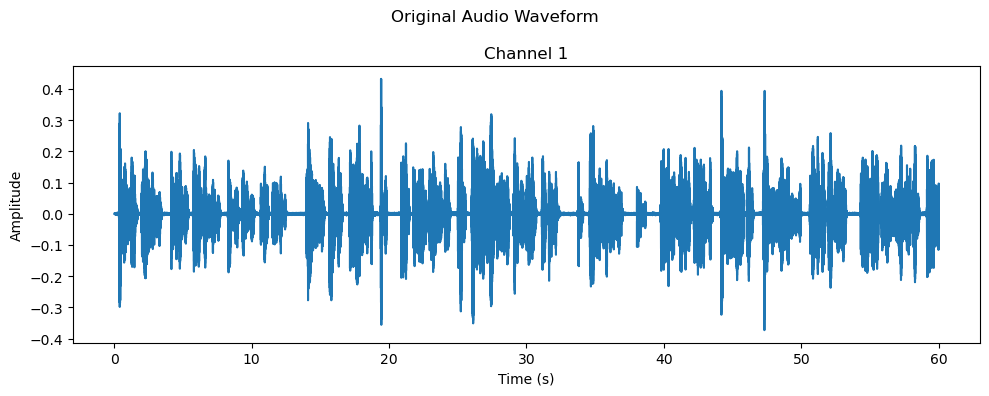

In [48]:
plot_waveform(audio, sr, title="Original Audio Waveform")